In [4]:
# 딥러닝을 구동하는 데 필요한 케라스 함수를 불러옵니다.
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import os

# 실행할 때마다 같은 결과를 출력하기 위해 설정하는 부분입니다.
np.random.seed(3)
tf.random.set_seed(3)

data = pd.read_csv('../dataset/riceClassification.csv')

In [5]:
data.head()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1


In [6]:
data.describe()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
count,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000
mean,9093.000000,7036.492989,151.680754,59.807851,0.915406,7225.817872,94.132952,0.616653,351.606949,0.707998,2.599081,0.549079
std,5249.701658,1467.197150,12.376402,10.061653,0.030575,1502.006571,9.906250,0.104389,29.500620,0.067310,0.434836,0.497599
min,1.000000,2522.000000,74.133114,34.409894,0.676647,2579.000000,56.666658,0.383239,197.015000,0.174590,1.358128,0.000000
25%,4547.000000,5962.000000,145.675910,51.393151,0.891617,6125.000000,87.126656,0.538530,333.990000,0.650962,2.208527,0.000000
50%,9093.000000,6660.000000,153.883750,55.724288,0.923259,6843.000000,92.085696,0.601194,353.088000,0.701941,2.602966,1.000000
75%,13639.000000,8423.000000,160.056214,70.156593,0.941372,8645.000000,103.559146,0.695664,373.003000,0.769280,2.964101,1.000000
max,18185.000000,10210.000000,183.211434,82.550762,0.966774,11008.000000,114.016559,0.886573,508.511000,0.904748,3.911845,1.000000


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


In [9]:
data.isna().sum(axis=0)

id                 0
Area               0
MajorAxisLength    0
MinorAxisLength    0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Perimeter          0
Roundness          0
AspectRation       0
Class              0
dtype: int64

In [8]:
import pandas_profiling as pp
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
print("data['Class'].nunique() : ",data['Class'].nunique())
print("data['Class'].unique() : " , data['Class'].unique() )    
print("(data['Class']==0).sum() : ",(data['Class']==0).sum())
print("(data['Class']==1).sum() : ",(data['Class']==1).sum())

data['Class'].nunique() :  2
data['Class'].unique() :  [1 0]
(data['Class']==0).sum() :  8200
(data['Class']==1).sum() :  9985


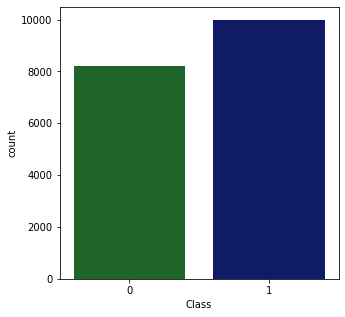

In [32]:
%matplotlib inline

plt.figure(figsize=(5,5))
colors = ['#137020','#001176']
sns.countplot(x='Class',data=data,palette=colors)
plt.show()

C:\Users\xpflx\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  


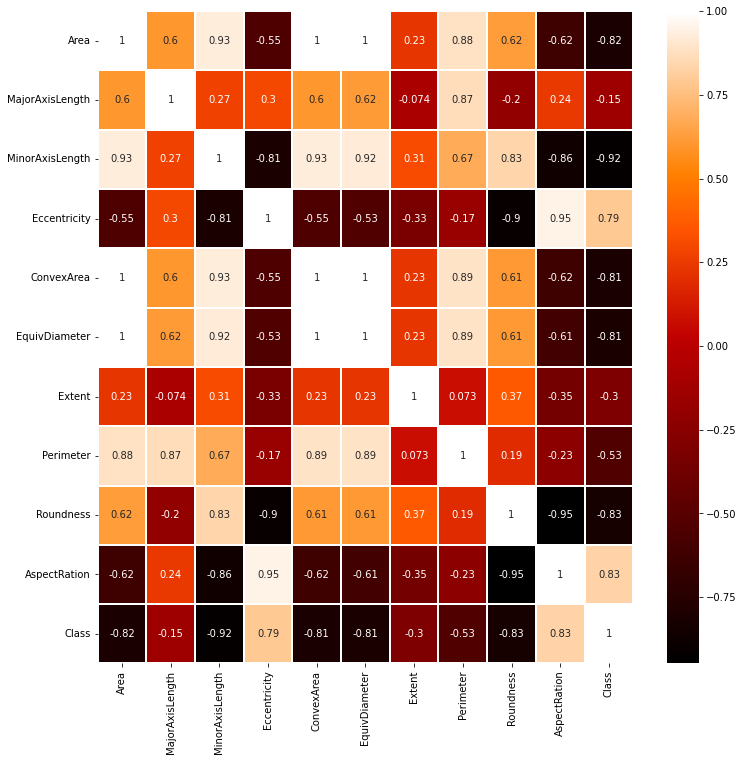

In [80]:
# 데이터 간의 상관관계를 그래프로 표현해 봅니다.

colormap = plt.cm.gist_heat   #그래프의 색상 구성을 정합니다.
plt.figure(figsize=(12,12))   #그래프의 크기를 정합니다.

# 그래프의 속성을 결정합니다. vmax의 값을 1로 지정해 1에 가까울 수록 밝은 색으로 표시되게 합니다.
sns.heatmap(data.corr(),linewidths=0.1,vmax=1, cmap=colormap, linecolor='white', annot=True)
plt.show()

In [24]:
data.describe()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
count,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000
mean,9093.000000,7036.492989,151.680754,59.807851,0.915406,7225.817872,94.132952,0.616653,351.606949,0.707998,2.599081,0.549079
std,5249.701658,1467.197150,12.376402,10.061653,0.030575,1502.006571,9.906250,0.104389,29.500620,0.067310,0.434836,0.497599
min,1.000000,2522.000000,74.133114,34.409894,0.676647,2579.000000,56.666658,0.383239,197.015000,0.174590,1.358128,0.000000
25%,4547.000000,5962.000000,145.675910,51.393151,0.891617,6125.000000,87.126656,0.538530,333.990000,0.650962,2.208527,0.000000
50%,9093.000000,6660.000000,153.883750,55.724288,0.923259,6843.000000,92.085696,0.601194,353.088000,0.701941,2.602966,1.000000
75%,13639.000000,8423.000000,160.056214,70.156593,0.941372,8645.000000,103.559146,0.695664,373.003000,0.769280,2.964101,1.000000
max,18185.000000,10210.000000,183.211434,82.550762,0.966774,11008.000000,114.016559,0.886573,508.511000,0.904748,3.911845,1.000000


In [34]:
data.drop(columns=['id'],inplace=True)

KeyError: "['id'] not found in axis"

In [36]:
data

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...
18180,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


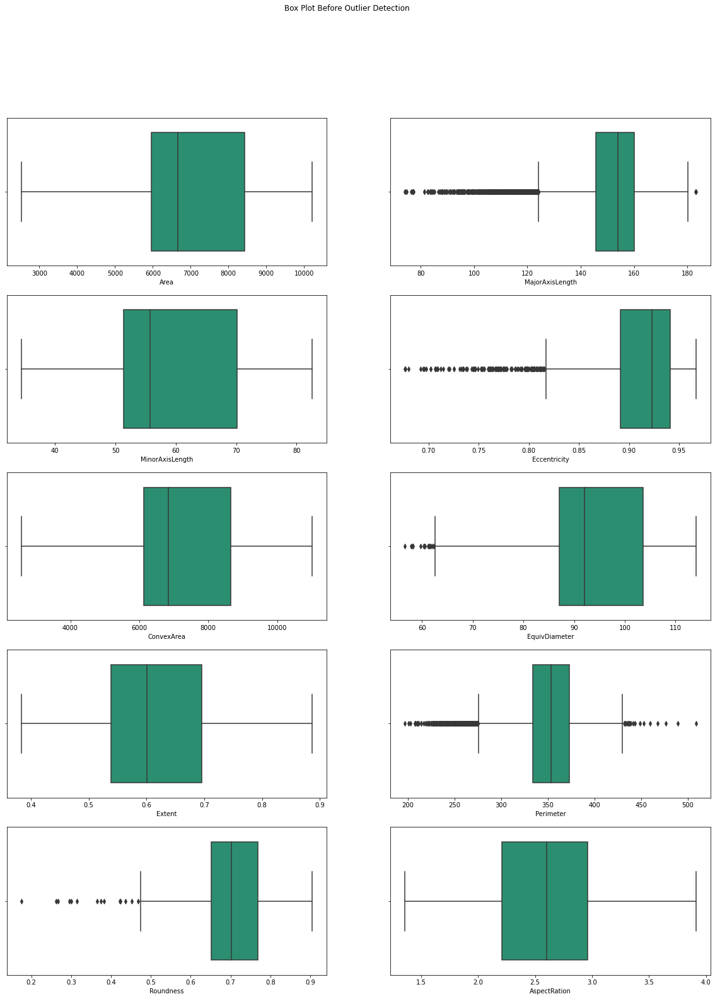

In [47]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Box Plot Before Outlier Detection')
k = 0
for i in range(0,5):
    for j in range(0,2):
        sns.boxplot(ax=axes[i,j], data=data, x=data.columns[k], palette='Dark2')
        k=k+1

In [48]:
# Calculating the IQR
def iqr_calculation(main_df,col):
    Q1 = np.percentile(col,25,interpolation = 'midpoint')
    Q3 = np.percentile(col,75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    upper = np.where(col>=(Q3+1.5*IQR))
    lower = np.where(col<=(Q1-1.5*IQR))
    return upper,lower
    
# Remove the outliers
def remove_outliers(main_df,upper,lower):
    main_df.drop(upper[0], inplace = True)
    main_df.drop(lower[0], inplace = True)
    print("New Shape: ", main_df.shape)
    return main_df

# Resetting the dataframe index
def reset_dataframe(main_df):
    main_df.reset_index(inplace=True)
    main_df.drop(columns=['index'],inplace=True)
    return main_df

In [53]:
main_df = data

for i in range(0,len(main_df.columns)-1):
    print('For ',data.columns[i])
    upper, lower = iqr_calculation(main_df,data[data.columns[i]])
    main_df = remove_outliers(main_df,upper,lower)
    miningData = reset_dataframe(main_df)

For  Area
New Shape:  (17597, 11)
For  MajorAxisLength
New Shape:  (17513, 11)
For  MinorAxisLength
New Shape:  (17513, 11)
For  Eccentricity
New Shape:  (17513, 11)
For  ConvexArea
New Shape:  (17513, 11)
For  EquivDiameter
New Shape:  (17513, 11)
For  Extent
New Shape:  (17513, 11)
For  Perimeter
New Shape:  (17512, 11)
For  Roundness
New Shape:  (17512, 11)
For  AspectRation
New Shape:  (17512, 11)


In [55]:
miningData.describe()

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
count,17512.000000,17512.000000,17512.000000,17512.000000,17512.000000,17512.000000,17512.000000,17512.000000,17512.000000,17512.000000,17512.000000
mean,7120.999429,153.111543,59.994757,0.917290,7311.732698,94.757256,0.615711,354.243111,0.706071,2.616526,0.541172
std,1408.067582,9.761761,10.004875,0.027201,1441.564713,9.370463,0.104563,25.451656,0.065596,0.424861,0.498316
min,3698.000000,126.113616,36.177914,0.819338,3883.000000,68.618072,0.383239,280.617000,0.474142,1.744254,0.000000
25%,6026.000000,146.753340,51.474417,0.892392,6188.750000,87.593045,0.536665,336.314000,0.650114,2.216013,0.000000
50%,6718.500000,154.340392,55.957733,0.925704,6901.000000,92.489242,0.600178,354.389500,0.697093,2.643761,1.000000
75%,8471.000000,160.313152,70.253158,0.941690,8692.000000,103.853802,0.694678,373.704000,0.768136,2.971940,1.000000
max,10210.000000,180.332508,82.550762,0.966774,10659.000000,114.016559,0.886137,428.619000,0.854461,3.911845,1.000000


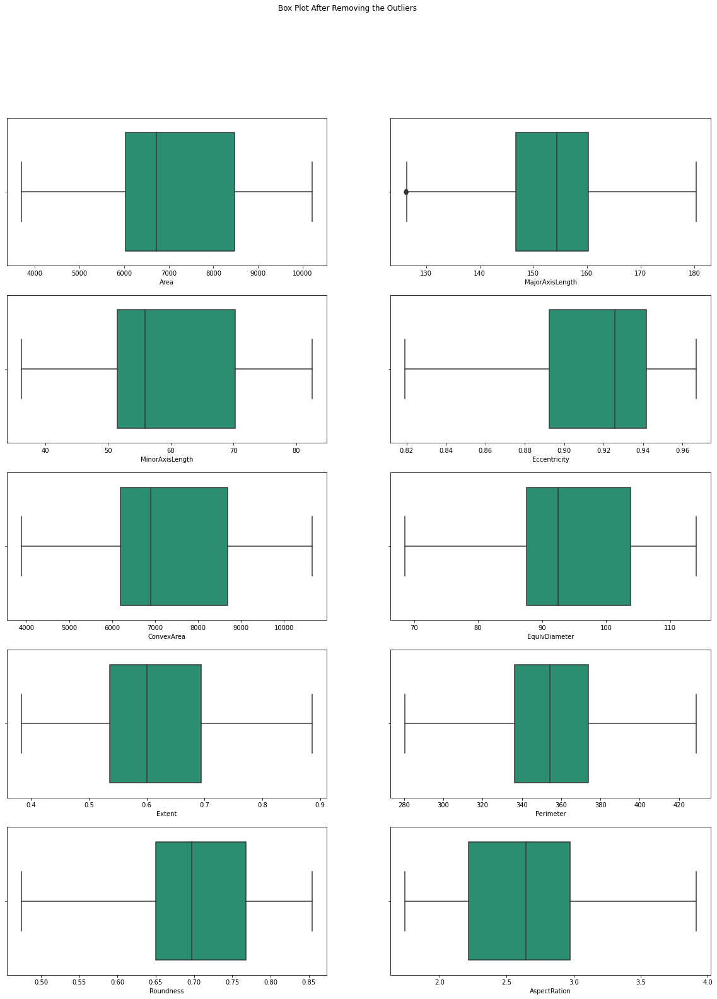

In [56]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Box Plot After Removing the Outliers')
k = 0
for i in range(0,5):
    for j in range(0,2):
        col_name = final_df.columns[k]
        sns.boxplot(ax=axes[i,j], data=final_df,x=col_name,palette='Dark2')
        k=k+1

In [76]:
y = miningData['Class']
X = miningData.drop(columns=['Class'])
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=11)

In [77]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
print(X_train_scaled)

[[ 1.49121359  0.65581872  1.40995925 ...  1.28001066  1.04676844
  -1.09032303]
 [-1.54122141 -1.66722259 -1.30533245 ... -2.00353221 -0.45946024
   0.70430567]
 [ 0.33003717 -0.57995655  0.6379323  ... -0.12059739  1.01769495
  -0.92728717]
 ...
 [-1.01968813 -0.18578091 -1.12274035 ... -0.71206091 -1.12500313
   1.14125202]
 [-0.95921019 -0.57203783 -0.88622458 ... -0.97042627 -0.58850456
   0.63176812]
 [ 0.38411156 -1.03237647  0.88205646 ... -0.37129987  1.57814834
  -1.26249555]]


In [78]:
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[-0.1203456 ,  0.9924755 , -0.47927193, ...,  0.25196064,
        -0.52384913,  0.77908066],
       [-0.17441999,  0.54335285, -0.38058719, ...,  0.24726021,
        -0.62916294,  0.47500558],
       [-1.27654149, -1.33083019, -1.06316064, ..., -1.52736734,
        -0.51643855,  0.52381261],
       ...,
       [-0.2718962 ,  0.33801714, -0.37554846, ..., -0.02094049,
        -0.44586743,  0.3857308 ],
       [-1.03747575,  0.14371294, -1.23706721, ..., -0.5882699 ,
        -1.34398148,  1.47410349],
       [-0.54369117, -0.32197811, -0.46935491, ..., -0.5132606 ,
        -0.30645535,  0.22409464]])

In [ ]:
#---------------------------------------------------------------------------------------

In [89]:
# 첫 행 제거하고 데이터셋 불러오기
# Class와 상관관계가 0에 가까운 MajorAxisLength는 제거하였음
data = pd.read_csv('../dataset/riceClassification.csv', usecols = [
                  'Area','MajorAxisLength','MinorAxisLength','Eccentricity','ConvexArea'
                   ,'EquivDiameter','Extent','Perimeter','Roundness','AspectRation','Class'])
dataset = data.values

#데이터 저장
X = dataset[:,0:10]
Y = dataset[:,10]

# 학습 셋과 테스트 셋의 구분
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3)


# 모델을 설정합니다.
model = Sequential()
model.add(Dense(16, input_dim=10, activation='relu')) # 11개의 입력층
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 모델을 컴파일합니다.
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])


# 모델을 실행합니다.
history = model.fit(X_train, Y_train, validation_split=0.33, epochs=800, batch_size=100)


Train on 8528 samples, validate on 4201 samples
Epoch 1/1600
8528/8528 [==============================] - 0s 41us/sample - loss: 410.1287 - accuracy: 0.5495 - val_loss: 9.3928 - val_accuracy: 0.4518
Epoch 2/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 55.3049 - accuracy: 0.4563 - val_loss: 47.9262 - val_accuracy: 0.5482
Epoch 3/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 23.5409 - accuracy: 0.5079 - val_loss: 7.9095 - val_accuracy: 0.5480
Epoch 4/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 5.4941 - accuracy: 0.5152 - val_loss: 6.0420 - val_accuracy: 0.4523
Epoch 5/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 4.2785 - accuracy: 0.5043 - val_loss: 3.5544 - val_accuracy: 0.5489
Epoch 6/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 1.6772 - accuracy: 0.5967 - val_loss: 0.6275 - val_accuracy: 0.7308
Epoch 7/1600
8528/8528 [==============================] - 

Epoch 56/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1358 - accuracy: 0.9486 - val_loss: 0.4004 - val_accuracy: 0.8934
Epoch 57/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.3398 - accuracy: 0.8952 - val_loss: 0.9572 - val_accuracy: 0.7784
Epoch 58/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.3190 - accuracy: 0.9042 - val_loss: 0.1115 - val_accuracy: 0.9572
Epoch 59/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1246 - accuracy: 0.9547 - val_loss: 0.3565 - val_accuracy: 0.8648
Epoch 60/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1716 - accuracy: 0.9398 - val_loss: 0.1089 - val_accuracy: 0.9581
Epoch 61/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1204 - accuracy: 0.9567 - val_loss: 0.1262 - val_accuracy: 0.9533
Epoch 62/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1569 - accuracy: 0.9481

Epoch 111/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.2121 - accuracy: 0.9360 - val_loss: 0.1142 - val_accuracy: 0.9607
Epoch 112/1600
8528/8528 [==============================] - 0s 3us/sample - loss: 0.0937 - accuracy: 0.9685 - val_loss: 0.0942 - val_accuracy: 0.9655
Epoch 113/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0991 - accuracy: 0.9682 - val_loss: 0.1571 - val_accuracy: 0.9403
Epoch 114/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1213 - accuracy: 0.9598 - val_loss: 0.2387 - val_accuracy: 0.9307
Epoch 115/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1600 - accuracy: 0.9496 - val_loss: 0.0905 - val_accuracy: 0.9667
Epoch 116/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0904 - accuracy: 0.9679 - val_loss: 0.0641 - val_accuracy: 0.9760
Epoch 117/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0896 - accuracy:

8528/8528 [==============================] - 0s 3us/sample - loss: 0.0717 - accuracy: 0.9796 - val_loss: 0.0776 - val_accuracy: 0.9752
Epoch 166/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0904 - accuracy: 0.9751 - val_loss: 0.1010 - val_accuracy: 0.9691
Epoch 167/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0799 - accuracy: 0.9763 - val_loss: 0.0529 - val_accuracy: 0.9824
Epoch 168/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0766 - accuracy: 0.9776 - val_loss: 0.0651 - val_accuracy: 0.9760
Epoch 169/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0729 - accuracy: 0.9783 - val_loss: 0.0514 - val_accuracy: 0.9829
Epoch 170/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0723 - accuracy: 0.9788 - val_loss: 0.0668 - val_accuracy: 0.9769
Epoch 171/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0885 - accuracy: 0.9754 - val_l

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0994 - accuracy: 0.9744 - val_loss: 0.0699 - val_accuracy: 0.9783
Epoch 220/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1016 - accuracy: 0.9749 - val_loss: 0.0760 - val_accuracy: 0.9733
Epoch 221/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0719 - accuracy: 0.9799 - val_loss: 0.0928 - val_accuracy: 0.9736
Epoch 222/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0844 - accuracy: 0.9789 - val_loss: 0.0669 - val_accuracy: 0.9781
Epoch 223/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0723 - accuracy: 0.9802 - val_loss: 0.1207 - val_accuracy: 0.9605
Epoch 224/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0971 - accuracy: 0.9773 - val_loss: 0.0524 - val_accuracy: 0.9817
Epoch 225/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0841 - accuracy: 0.9780 - val_l

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0889 - accuracy: 0.9794 - val_loss: 0.0567 - val_accuracy: 0.9848
Epoch 274/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0766 - accuracy: 0.9824 - val_loss: 0.0552 - val_accuracy: 0.9850
Epoch 275/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0753 - accuracy: 0.9822 - val_loss: 0.0614 - val_accuracy: 0.9838
Epoch 276/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0896 - accuracy: 0.9798 - val_loss: 0.0591 - val_accuracy: 0.9836
Epoch 277/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0803 - accuracy: 0.9821 - val_loss: 0.0524 - val_accuracy: 0.9862
Epoch 278/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0746 - accuracy: 0.9810 - val_loss: 0.1317 - val_accuracy: 0.9610
Epoch 279/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1396 - accuracy: 0.9688 - val_l

Epoch 328/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0807 - accuracy: 0.9808 - val_loss: 0.0638 - val_accuracy: 0.9829
Epoch 329/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0843 - accuracy: 0.9809 - val_loss: 0.0521 - val_accuracy: 0.9845
Epoch 330/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0848 - accuracy: 0.9809 - val_loss: 0.0800 - val_accuracy: 0.9762
Epoch 331/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0775 - accuracy: 0.9809 - val_loss: 0.0506 - val_accuracy: 0.9857
Epoch 332/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0700 - accuracy: 0.9823 - val_loss: 0.0523 - val_accuracy: 0.9843
Epoch 333/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0851 - accuracy: 0.9795 - val_loss: 0.1577 - val_accuracy: 0.9660
Epoch 334/1600
8528/8528 [==============================] - 0s 7us/sample - loss: 0.1265 - accuracy:

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0706 - accuracy: 0.9828 - val_loss: 0.0483 - val_accuracy: 0.9871
Epoch 382/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1043 - accuracy: 0.9781 - val_loss: 0.0499 - val_accuracy: 0.9864
Epoch 383/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0899 - accuracy: 0.9824 - val_loss: 0.0687 - val_accuracy: 0.9817
Epoch 384/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0872 - accuracy: 0.9810 - val_loss: 0.1014 - val_accuracy: 0.9764
Epoch 385/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0800 - accuracy: 0.9831 - val_loss: 0.1447 - val_accuracy: 0.9593
Epoch 386/1600
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1515 - accuracy: 0.9674 - val_loss: 0.0686 - val_accuracy: 0.9793
Epoch 387/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0812 - accuracy: 0.9819 - val_l

Epoch 436/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0840 - accuracy: 0.9823 - val_loss: 0.0828 - val_accuracy: 0.9769
Epoch 437/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0765 - accuracy: 0.9822 - val_loss: 0.0498 - val_accuracy: 0.9879
Epoch 438/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0772 - accuracy: 0.9839 - val_loss: 0.0607 - val_accuracy: 0.9836
Epoch 439/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0864 - accuracy: 0.9814 - val_loss: 0.0807 - val_accuracy: 0.9776
Epoch 440/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0824 - accuracy: 0.9826 - val_loss: 0.0796 - val_accuracy: 0.9814
Epoch 441/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1005 - accuracy: 0.9797 - val_loss: 0.0601 - val_accuracy: 0.9850
Epoch 442/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0912 - accuracy:

8528/8528 [==============================] - 0s 4us/sample - loss: 0.1148 - accuracy: 0.9773 - val_loss: 0.0527 - val_accuracy: 0.9869
Epoch 491/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0838 - accuracy: 0.9826 - val_loss: 0.0598 - val_accuracy: 0.9843
Epoch 492/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0756 - accuracy: 0.9849 - val_loss: 0.0748 - val_accuracy: 0.9802
Epoch 493/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0801 - accuracy: 0.9837 - val_loss: 0.0635 - val_accuracy: 0.9836
Epoch 494/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0802 - accuracy: 0.9838 - val_loss: 0.0518 - val_accuracy: 0.9876
Epoch 495/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0758 - accuracy: 0.9845 - val_loss: 0.0687 - val_accuracy: 0.9826
Epoch 496/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0874 - accuracy: 0.9832 - val_l

Epoch 545/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0991 - accuracy: 0.9795 - val_loss: 0.1520 - val_accuracy: 0.9595
Epoch 546/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0909 - accuracy: 0.9812 - val_loss: 0.0498 - val_accuracy: 0.9876
Epoch 547/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0708 - accuracy: 0.9848 - val_loss: 0.1052 - val_accuracy: 0.9779
Epoch 548/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1049 - accuracy: 0.9799 - val_loss: 0.0484 - val_accuracy: 0.9888
Epoch 549/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0719 - accuracy: 0.9845 - val_loss: 0.0483 - val_accuracy: 0.9888
Epoch 550/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0786 - accuracy: 0.9838 - val_loss: 0.0555 - val_accuracy: 0.9867
Epoch 551/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0858 - accuracy:

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0752 - accuracy: 0.9857 - val_loss: 0.0520 - val_accuracy: 0.9883
Epoch 600/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0860 - accuracy: 0.9835 - val_loss: 0.1670 - val_accuracy: 0.9588
Epoch 601/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0944 - accuracy: 0.9791 - val_loss: 0.3314 - val_accuracy: 0.9264
Epoch 602/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1300 - accuracy: 0.9748 - val_loss: 0.0499 - val_accuracy: 0.9891
Epoch 603/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0789 - accuracy: 0.9846 - val_loss: 0.0891 - val_accuracy: 0.9774
Epoch 604/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1089 - accuracy: 0.9792 - val_loss: 0.0659 - val_accuracy: 0.9848
Epoch 605/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0985 - accuracy: 0.9821 - val_l

Epoch 654/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0741 - accuracy: 0.9848 - val_loss: 0.0869 - val_accuracy: 0.9786
Epoch 655/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0885 - accuracy: 0.9830 - val_loss: 0.0537 - val_accuracy: 0.9874
Epoch 656/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0800 - accuracy: 0.9837 - val_loss: 0.0710 - val_accuracy: 0.9845
Epoch 657/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0943 - accuracy: 0.9826 - val_loss: 0.0560 - val_accuracy: 0.9869
Epoch 658/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0824 - accuracy: 0.9825 - val_loss: 0.1346 - val_accuracy: 0.9664
Epoch 659/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1090 - accuracy: 0.9801 - val_loss: 0.1231 - val_accuracy: 0.9762
Epoch 660/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0908 - accuracy:

Epoch 708/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0995 - accuracy: 0.9819 - val_loss: 0.0546 - val_accuracy: 0.9862
Epoch 709/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0739 - accuracy: 0.9860 - val_loss: 0.0551 - val_accuracy: 0.9874
Epoch 710/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0772 - accuracy: 0.9853 - val_loss: 0.1953 - val_accuracy: 0.9541
Epoch 711/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1728 - accuracy: 0.9686 - val_loss: 0.5427 - val_accuracy: 0.9245
Epoch 712/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.2079 - accuracy: 0.9638 - val_loss: 0.1100 - val_accuracy: 0.9783
Epoch 713/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1319 - accuracy: 0.9771 - val_loss: 0.2065 - val_accuracy: 0.9519
Epoch 714/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1362 - accuracy:

Epoch 762/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0812 - accuracy: 0.9849 - val_loss: 0.0518 - val_accuracy: 0.9891
Epoch 763/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0812 - accuracy: 0.9841 - val_loss: 0.2726 - val_accuracy: 0.9414
Epoch 764/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1741 - accuracy: 0.9690 - val_loss: 0.0518 - val_accuracy: 0.9898
Epoch 765/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0785 - accuracy: 0.9859 - val_loss: 0.0553 - val_accuracy: 0.9879
Epoch 766/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0846 - accuracy: 0.9839 - val_loss: 0.0530 - val_accuracy: 0.9881
Epoch 767/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1009 - accuracy: 0.9815 - val_loss: 0.0947 - val_accuracy: 0.9824
Epoch 768/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0841 - accuracy:

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0899 - accuracy: 0.9835 - val_loss: 0.0992 - val_accuracy: 0.9764
Epoch 817/1600
8528/8528 [==============================] - ETA: 0s - loss: 0.1015 - accuracy: 0.97 - 0s 4us/sample - loss: 0.1018 - accuracy: 0.9816 - val_loss: 0.0738 - val_accuracy: 0.9843
Epoch 818/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1002 - accuracy: 0.9823 - val_loss: 0.1442 - val_accuracy: 0.9731
Epoch 819/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1608 - accuracy: 0.9708 - val_loss: 0.3187 - val_accuracy: 0.9517
Epoch 820/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.2278 - accuracy: 0.9587 - val_loss: 1.4266 - val_accuracy: 0.7786
Epoch 821/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 2.0607 - accuracy: 0.7951 - val_loss: 0.6988 - val_accuracy: 0.9112
Epoch 822/1600
8528/8528 [==============================] - ETA: 0s - los

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0809 - accuracy: 0.9860 - val_loss: 0.0620 - val_accuracy: 0.9848
Epoch 870/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0757 - accuracy: 0.9849 - val_loss: 0.0504 - val_accuracy: 0.9891
Epoch 871/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0811 - accuracy: 0.9856 - val_loss: 0.0523 - val_accuracy: 0.9891
Epoch 872/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0746 - accuracy: 0.9855 - val_loss: 0.0546 - val_accuracy: 0.9867
Epoch 873/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0752 - accuracy: 0.9862 - val_loss: 0.1894 - val_accuracy: 0.9557
Epoch 874/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0925 - accuracy: 0.9821 - val_loss: 0.0526 - val_accuracy: 0.9883
Epoch 875/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0769 - accuracy: 0.9860 - val_l

8528/8528 [==============================] - 0s 4us/sample - loss: 0.5331 - accuracy: 0.9308 - val_loss: 0.0571 - val_accuracy: 0.9883
Epoch 924/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1140 - accuracy: 0.9788 - val_loss: 0.0687 - val_accuracy: 0.9864
Epoch 925/1600
8528/8528 [==============================] - 0s 3us/sample - loss: 0.0824 - accuracy: 0.9851 - val_loss: 0.0623 - val_accuracy: 0.9876
Epoch 926/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0928 - accuracy: 0.9862 - val_loss: 0.1170 - val_accuracy: 0.9738
Epoch 927/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0934 - accuracy: 0.9835 - val_loss: 0.0538 - val_accuracy: 0.9905
Epoch 928/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1078 - accuracy: 0.9819 - val_loss: 0.0942 - val_accuracy: 0.9831
Epoch 929/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0956 - accuracy: 0.9838 - val_l

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0977 - accuracy: 0.9836 - val_loss: 0.0592 - val_accuracy: 0.9864
Epoch 978/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0900 - accuracy: 0.9851 - val_loss: 0.3585 - val_accuracy: 0.9267
Epoch 979/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.2176 - accuracy: 0.9628 - val_loss: 0.0613 - val_accuracy: 0.9874
Epoch 980/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.2039 - accuracy: 0.9649 - val_loss: 0.0526 - val_accuracy: 0.9891
Epoch 981/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0853 - accuracy: 0.9838 - val_loss: 0.0524 - val_accuracy: 0.9905
Epoch 982/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0739 - accuracy: 0.9873 - val_loss: 0.0622 - val_accuracy: 0.9850
Epoch 983/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0859 - accuracy: 0.9843 - val_l

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0755 - accuracy: 0.9864 - val_loss: 0.0544 - val_accuracy: 0.9895
Epoch 1032/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0855 - accuracy: 0.9841 - val_loss: 0.0835 - val_accuracy: 0.9843
Epoch 1033/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1043 - accuracy: 0.9829 - val_loss: 0.1072 - val_accuracy: 0.9814
Epoch 1034/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0899 - accuracy: 0.9839 - val_loss: 0.0642 - val_accuracy: 0.9867
Epoch 1035/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0805 - accuracy: 0.9857 - val_loss: 0.0756 - val_accuracy: 0.9826
Epoch 1036/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0877 - accuracy: 0.9850 - val_loss: 0.0921 - val_accuracy: 0.9802
Epoch 1037/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0787 - accuracy: 0.9852 -

8528/8528 [==============================] - 0s 4us/sample - loss: 0.1004 - accuracy: 0.9831 - val_loss: 0.0862 - val_accuracy: 0.9841
Epoch 1086/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1071 - accuracy: 0.9826 - val_loss: 0.0620 - val_accuracy: 0.9855
Epoch 1087/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0932 - accuracy: 0.9851 - val_loss: 0.0626 - val_accuracy: 0.9876
Epoch 1088/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0951 - accuracy: 0.9832 - val_loss: 0.0548 - val_accuracy: 0.9881
Epoch 1089/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0805 - accuracy: 0.9860 - val_loss: 0.0552 - val_accuracy: 0.9879
Epoch 1090/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0778 - accuracy: 0.9859 - val_loss: 0.0664 - val_accuracy: 0.9871
Epoch 1091/1600
8528/8528 [==============================] - 0s 7us/sample - loss: 0.0886 - accuracy: 0.9849 -

Epoch 1139/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0870 - accuracy: 0.9863 - val_loss: 0.0718 - val_accuracy: 0.9876
Epoch 1140/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0869 - accuracy: 0.9858 - val_loss: 0.0608 - val_accuracy: 0.9883
Epoch 1141/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0845 - accuracy: 0.9864 - val_loss: 0.0600 - val_accuracy: 0.9898
Epoch 1142/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0855 - accuracy: 0.9856 - val_loss: 0.0613 - val_accuracy: 0.9891
Epoch 1143/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0955 - accuracy: 0.9857 - val_loss: 0.0948 - val_accuracy: 0.9817
Epoch 1144/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0940 - accuracy: 0.9848 - val_loss: 0.0756 - val_accuracy: 0.9867
Epoch 1145/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1091 - ac

Epoch 1193/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1062 - accuracy: 0.9835 - val_loss: 0.1638 - val_accuracy: 0.9752
Epoch 1194/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1170 - accuracy: 0.9829 - val_loss: 0.0973 - val_accuracy: 0.9836
Epoch 1195/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1012 - accuracy: 0.9836 - val_loss: 0.0898 - val_accuracy: 0.9843
Epoch 1196/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1067 - accuracy: 0.9836 - val_loss: 0.0606 - val_accuracy: 0.9876
Epoch 1197/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0921 - accuracy: 0.9851 - val_loss: 0.1488 - val_accuracy: 0.9767
Epoch 1198/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0909 - accuracy: 0.9853 - val_loss: 0.2006 - val_accuracy: 0.9600
Epoch 1199/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1260 - ac

Epoch 1247/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0843 - accuracy: 0.9853 - val_loss: 0.0935 - val_accuracy: 0.9805
Epoch 1248/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0953 - accuracy: 0.9839 - val_loss: 0.8546 - val_accuracy: 0.8555
Epoch 1249/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1606 - accuracy: 0.9722 - val_loss: 0.0556 - val_accuracy: 0.9902
Epoch 1250/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0845 - accuracy: 0.9845 - val_loss: 0.0693 - val_accuracy: 0.9848
Epoch 1251/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0826 - accuracy: 0.9869 - val_loss: 0.0704 - val_accuracy: 0.9871
Epoch 1252/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1351 - accuracy: 0.9790 - val_loss: 0.1083 - val_accuracy: 0.9767
Epoch 1253/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1055 - ac

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0849 - accuracy: 0.9867 - val_loss: 0.0634 - val_accuracy: 0.9871
Epoch 1302/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0930 - accuracy: 0.9850 - val_loss: 0.0646 - val_accuracy: 0.9881
Epoch 1303/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1099 - accuracy: 0.9832 - val_loss: 0.0660 - val_accuracy: 0.9881
Epoch 1304/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0940 - accuracy: 0.9857 - val_loss: 0.3070 - val_accuracy: 0.9429
Epoch 1305/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1412 - accuracy: 0.9787 - val_loss: 0.1313 - val_accuracy: 0.9731
Epoch 1306/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1115 - accuracy: 0.9823 - val_loss: 0.0673 - val_accuracy: 0.9876
Epoch 1307/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0975 - accuracy: 0.9849 -

8528/8528 [==============================] - 0s 4us/sample - loss: 0.1141 - accuracy: 0.9822 - val_loss: 0.0580 - val_accuracy: 0.9902
Epoch 1355/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0875 - accuracy: 0.9864 - val_loss: 0.0825 - val_accuracy: 0.9826
Epoch 1356/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0911 - accuracy: 0.9836 - val_loss: 0.1283 - val_accuracy: 0.9788
Epoch 1357/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1477 - accuracy: 0.9776 - val_loss: 0.0755 - val_accuracy: 0.9843
Epoch 1358/1600
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1196 - accuracy: 0.9798 - val_loss: 0.1104 - val_accuracy: 0.9821
Epoch 1359/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1473 - accuracy: 0.9764 - val_loss: 3.0824 - val_accuracy: 0.6786
Epoch 1360/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 2.0044 - accuracy: 0.8213 -

8528/8528 [==============================] - 0s 4us/sample - loss: 0.1482 - accuracy: 0.9768 - val_loss: 0.0646 - val_accuracy: 0.9881
Epoch 1409/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1034 - accuracy: 0.9826 - val_loss: 0.0866 - val_accuracy: 0.9845
Epoch 1410/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0889 - accuracy: 0.9860 - val_loss: 0.0596 - val_accuracy: 0.9891
Epoch 1411/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1189 - accuracy: 0.9802 - val_loss: 0.0726 - val_accuracy: 0.9848
Epoch 1412/1600
8528/8528 [==============================] - ETA: 0s - loss: 0.1116 - accuracy: 0.98 - 0s 4us/sample - loss: 0.1156 - accuracy: 0.9809 - val_loss: 0.1292 - val_accuracy: 0.9731
Epoch 1413/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0931 - accuracy: 0.9841 - val_loss: 0.0575 - val_accuracy: 0.9902
Epoch 1414/1600
8528/8528 [==============================] - 0s 4us/

Epoch 1462/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0827 - accuracy: 0.9859 - val_loss: 0.1944 - val_accuracy: 0.9605
Epoch 1463/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1729 - accuracy: 0.9736 - val_loss: 0.0918 - val_accuracy: 0.9812
Epoch 1464/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1588 - accuracy: 0.9736 - val_loss: 0.0831 - val_accuracy: 0.9824
Epoch 1465/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1467 - accuracy: 0.9775 - val_loss: 0.0563 - val_accuracy: 0.9898
Epoch 1466/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0943 - accuracy: 0.9824 - val_loss: 0.0747 - val_accuracy: 0.9871
Epoch 1467/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1406 - accuracy: 0.9780 - val_loss: 0.0622 - val_accuracy: 0.9869
Epoch 1468/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0847 - ac

8528/8528 [==============================] - 0s 4us/sample - loss: 0.0852 - accuracy: 0.9870 - val_loss: 0.0625 - val_accuracy: 0.9879
Epoch 1517/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0913 - accuracy: 0.9858 - val_loss: 0.0612 - val_accuracy: 0.9888
Epoch 1518/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0870 - accuracy: 0.9867 - val_loss: 0.0611 - val_accuracy: 0.9891
Epoch 1519/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0870 - accuracy: 0.9863 - val_loss: 0.0608 - val_accuracy: 0.9893
Epoch 1520/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0844 - accuracy: 0.9867 - val_loss: 0.0608 - val_accuracy: 0.9891
Epoch 1521/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0874 - accuracy: 0.9860 - val_loss: 0.0712 - val_accuracy: 0.9850
Epoch 1522/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0952 - accuracy: 0.9856 -

8528/8528 [==============================] - 0s 4us/sample - loss: 0.1342 - accuracy: 0.9796 - val_loss: 0.1148 - val_accuracy: 0.9764
Epoch 1571/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1058 - accuracy: 0.9837 - val_loss: 0.0590 - val_accuracy: 0.9891
Epoch 1572/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0850 - accuracy: 0.9859 - val_loss: 0.0602 - val_accuracy: 0.9886
Epoch 1573/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0858 - accuracy: 0.9866 - val_loss: 0.0709 - val_accuracy: 0.9845
Epoch 1574/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1028 - accuracy: 0.9838 - val_loss: 0.1022 - val_accuracy: 0.9800
Epoch 1575/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.0992 - accuracy: 0.9835 - val_loss: 0.1391 - val_accuracy: 0.9714
Epoch 1576/1600
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1065 - accuracy: 0.9830 -

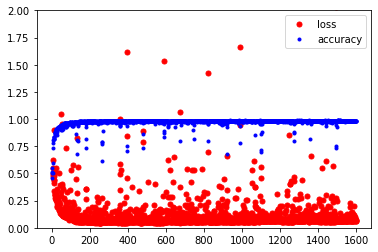

In [90]:
# y_vloss에 테스트셋으로 실험 결과의 오차 값을 저장
y_vloss=history.history['val_loss']

# y_acc 에 학습 셋으로 측정한 정확도의 값을 저장
y_acc=history.history['accuracy']

# x값을 지정하고 정확도를 파란색으로, 오차를 빨간색으로 표시
x_len = np.arange(len(y_acc))
plt.plot(x_len, y_vloss, "o", c="red", markersize=5, label="loss")
plt.plot(x_len, y_acc, "o", c="blue", markersize=3, label="accuracy")
plt.legend()

plt.ylim(0,2)
plt.show()


C:\Users\xpflx\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:14: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  


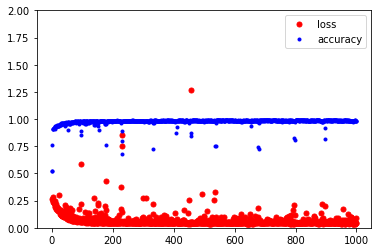

In [85]:
# y_vloss에 테스트셋으로 실험 결과의 오차 값을 저장
y_vloss=history.history['val_loss']

# y_acc 에 학습 셋으로 측정한 정확도의 값을 저장
y_acc=history.history['accuracy']

# x값을 지정하고 정확도를 파란색으로, 오차를 빨간색으로 표시
x_len = np.arange(len(y_acc))
plt.plot(x_len, y_vloss, "o", c="red", markersize=5, label="loss")
plt.plot(x_len, y_acc, "o", c="blue", markersize=3, label="accuracy")
plt.legend()

plt.ylim(0,2)
plt.show()


In [71]:
# 200 에폭이 적당함을 알아냈음
# 모델 저장 폴더 설정
MODEL_DIR = 'model/'
if not os.path.exists(MODEL_DIR):
   os.mkdir(MODEL_DIR)

# 모델 저장 조건 설정
modelpath="./model/{epoch:02d}-{val_loss:.4f}.hdf5"
checkpointer = ModelCheckpoint(filepath=modelpath, monitor='val_loss', verbose=1, save_best_only=True)

# 모델을 실행합니다.
history = model.fit(X_train, Y_train, validation_split=0.33, epochs=200, batch_size=300, verbose=0, callbacks=[checkpointer])



Epoch 00001: val_loss improved from inf to 0.03523, saving model to ./model/01-0.0352.hdf5

Epoch 00002: val_loss did not improve from 0.03523

Epoch 00003: val_loss did not improve from 0.03523

Epoch 00004: val_loss did not improve from 0.03523

Epoch 00005: val_loss did not improve from 0.03523

Epoch 00006: val_loss did not improve from 0.03523

Epoch 00007: val_loss did not improve from 0.03523

Epoch 00008: val_loss did not improve from 0.03523

Epoch 00009: val_loss did not improve from 0.03523

Epoch 00010: val_loss improved from 0.03523 to 0.03515, saving model to ./model/10-0.0352.hdf5

Epoch 00011: val_loss did not improve from 0.03515

Epoch 00012: val_loss did not improve from 0.03515

Epoch 00013: val_loss did not improve from 0.03515

Epoch 00014: val_loss did not improve from 0.03515

Epoch 00015: val_loss did not improve from 0.03515

Epoch 00016: val_loss did not improve from 0.03515

Epoch 00017: val_loss did not improve from 0.03515

Epoch 00018: val_loss did not i


Epoch 00153: val_loss did not improve from 0.03466

Epoch 00154: val_loss did not improve from 0.03466

Epoch 00155: val_loss did not improve from 0.03466

Epoch 00156: val_loss did not improve from 0.03466

Epoch 00157: val_loss did not improve from 0.03466

Epoch 00158: val_loss did not improve from 0.03466

Epoch 00159: val_loss did not improve from 0.03466

Epoch 00160: val_loss did not improve from 0.03466

Epoch 00161: val_loss did not improve from 0.03466

Epoch 00162: val_loss did not improve from 0.03466

Epoch 00163: val_loss did not improve from 0.03466

Epoch 00164: val_loss did not improve from 0.03466

Epoch 00165: val_loss did not improve from 0.03466

Epoch 00166: val_loss did not improve from 0.03466

Epoch 00167: val_loss did not improve from 0.03466

Epoch 00168: val_loss did not improve from 0.03466

Epoch 00169: val_loss did not improve from 0.03466

Epoch 00170: val_loss did not improve from 0.03466

Epoch 00171: val_loss did not improve from 0.03466

Epoch 00172

In [72]:
# 테스트셋으로 성능 평가
print("\n Accuracy: %.4f" % (model.evaluate(X_test, Y_test)[1]))
# 결론!!!!

5456/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================


 Accuracy: 0.9885


In [10]:
# 가설을 바탕으로 재구성
# Class와 상관관계가 가장 높은 두 칼럼을 선정
data2 = pd.read_csv('../dataset/riceClassification.csv',
                   usecols = ['Eccentricity', 'AspectRation', 'Class'])
data2.head()

,Eccentricity,AspectRation,Class
0,0.719916,1.440796,1
1,0.725553,1.453137,1
2,0.731211,1.465950,1
3,0.738639,1.483456,1
4,0.749282,1.510000,1


In [11]:
# 첫 행 제거하고 데이터셋 불러오기
data = pd.read_csv('../dataset/riceClassification.csv',
                   usecols = ['Eccentricity', 'AspectRation', 'Class'])
dataset = data.values

#데이터 저장
X = dataset[:,0:2]
Y = dataset[:,2]

# 학습 셋과 테스트 셋의 구분
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3)


# 모델을 설정합니다.
model = Sequential()
model.add(Dense(6, input_dim=2, activation='relu')) # 11개의 입력층
model.add(Dense(6, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 모델을 컴파일합니다.
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])


# 모델을 실행합니다.
history2 = model.fit(X_train, Y_train, validation_split=0.33, epochs=500, batch_size=500)



Train on 8528 samples, validate on 4201 samples
Epoch 1/500
8528/8528 [==============================] - 0s 42us/sample - loss: 0.7732 - accuracy: 0.4554 - val_loss: 0.7530 - val_accuracy: 0.4504
Epoch 2/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.7390 - accuracy: 0.4242 - val_loss: 0.7251 - val_accuracy: 0.0752
Epoch 3/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.7164 - accuracy: 0.2554 - val_loss: 0.7068 - val_accuracy: 0.5480
Epoch 4/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.7026 - accuracy: 0.5444 - val_loss: 0.6963 - val_accuracy: 0.5496
Epoch 5/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.6949 - accuracy: 0.5446 - val_loss: 0.6896 - val_accuracy: 0.5496
Epoch 6/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.6889 - accuracy: 0.5446 - val_loss: 0.6841 - val_accuracy: 0.5496
Epoch 7/500
8528/8528 [==============================] - 0s 4us/sampl

8528/8528 [==============================] - 0s 4us/sample - loss: 0.1301 - accuracy: 0.9627 - val_loss: 0.1309 - val_accuracy: 0.9600
Epoch 110/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1300 - accuracy: 0.9628 - val_loss: 0.1314 - val_accuracy: 0.9593
Epoch 111/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1312 - accuracy: 0.9621 - val_loss: 0.1307 - val_accuracy: 0.9607
Epoch 112/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1300 - accuracy: 0.9621 - val_loss: 0.1309 - val_accuracy: 0.9600
Epoch 113/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1297 - accuracy: 0.9631 - val_loss: 0.1305 - val_accuracy: 0.9605
Epoch 114/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1297 - accuracy: 0.9629 - val_loss: 0.1305 - val_accuracy: 0.9600
Epoch 115/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1295 - accuracy: 0.9628 - val_loss: 0

Epoch 218/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1272 - accuracy: 0.9628 - val_loss: 0.1289 - val_accuracy: 0.9600
Epoch 219/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1274 - accuracy: 0.9626 - val_loss: 0.1290 - val_accuracy: 0.9600
Epoch 220/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1276 - accuracy: 0.9628 - val_loss: 0.1288 - val_accuracy: 0.9600
Epoch 221/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1273 - accuracy: 0.9628 - val_loss: 0.1287 - val_accuracy: 0.9605
Epoch 222/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1273 - accuracy: 0.9624 - val_loss: 0.1289 - val_accuracy: 0.9602
Epoch 223/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1273 - accuracy: 0.9628 - val_loss: 0.1289 - val_accuracy: 0.9600
Epoch 224/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1272 - accuracy: 0.9633

Epoch 327/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1266 - accuracy: 0.9624 - val_loss: 0.1279 - val_accuracy: 0.9605
Epoch 328/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1263 - accuracy: 0.9627 - val_loss: 0.1283 - val_accuracy: 0.9600
Epoch 329/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1264 - accuracy: 0.9629 - val_loss: 0.1285 - val_accuracy: 0.9593
Epoch 330/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1265 - accuracy: 0.9625 - val_loss: 0.1279 - val_accuracy: 0.9602
Epoch 331/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1266 - accuracy: 0.9620 - val_loss: 0.1280 - val_accuracy: 0.9600
Epoch 332/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1266 - accuracy: 0.9626 - val_loss: 0.1280 - val_accuracy: 0.9600
Epoch 333/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1265 - accuracy: 0.9622

Epoch 382/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1257 - accuracy: 0.9620 - val_loss: 0.1273 - val_accuracy: 0.9600
Epoch 383/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1256 - accuracy: 0.9627 - val_loss: 0.1274 - val_accuracy: 0.9600
Epoch 384/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1254 - accuracy: 0.9627 - val_loss: 0.1272 - val_accuracy: 0.9605
Epoch 385/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1256 - accuracy: 0.9631 - val_loss: 0.1271 - val_accuracy: 0.9605
Epoch 386/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1257 - accuracy: 0.9621 - val_loss: 0.1273 - val_accuracy: 0.9602
Epoch 387/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1255 - accuracy: 0.9627 - val_loss: 0.1271 - val_accuracy: 0.9605
Epoch 388/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1255 - accuracy: 0.9627

Epoch 490/500
8528/8528 [==============================] - 0s 4us/sample - loss: 0.1242 - accuracy: 0.9628 - val_loss: 0.1256 - val_accuracy: 0.9600
Epoch 491/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1242 - accuracy: 0.9621 - val_loss: 0.1254 - val_accuracy: 0.9607
Epoch 492/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1241 - accuracy: 0.9619 - val_loss: 0.1254 - val_accuracy: 0.9600
Epoch 493/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1238 - accuracy: 0.9621 - val_loss: 0.1254 - val_accuracy: 0.9605
Epoch 494/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1237 - accuracy: 0.9632 - val_loss: 0.1257 - val_accuracy: 0.9600
Epoch 495/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1236 - accuracy: 0.9626 - val_loss: 0.1255 - val_accuracy: 0.9602
Epoch 496/500
8528/8528 [==============================] - 0s 3us/sample - loss: 0.1237 - accuracy: 0.9626

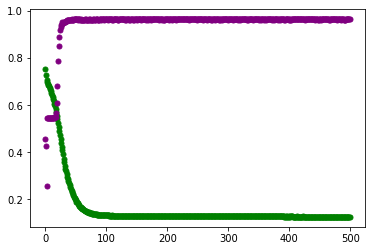

In [12]:
%matplotlib inline 

# y_vloss에 테스트셋으로 실험 결과의 오차 값을 저장
y_vloss2=history2.history['val_loss']

# y_acc 에 학습 셋으로 측정한 정확도의 값을 저장
y_acc2=history2.history['accuracy']

# x값을 지정하고 정확도를 파란색으로, 오차를 빨간색으로 표시
x_len2 = np.arange(len(y_acc2))
plt.plot(x_len2, y_vloss2, "o", c="green", markersize=5)
plt.plot(x_len2, y_acc2, "o", c="purple", markersize=5)

plt.show()

In [13]:
# 테스트 셋으로 결과를 출력합니다.
print("\n Accuracy: %.4f" % (model.evaluate(X_test, Y_test)[1]))

5456/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================


 Accuracy: 0.9610


In [104]:
array = model.predict(X_test)
t = 0
f = 0
for i,j in zip(array, Y_test):
    if(int(i) == int(j)):
        t += 1
    else:
        f += 1
print(f"성공개수 : {t} \t 실패개수 : {f}")
print(t/(t+f), "%")

성공개수 : 3989 	 실패개수 : 1467
0.7311217008797654 %


In [115]:

# 모델을 설정합니다.
model = Sequential()
model.add(Dense(16, input_dim=10, activation='relu')) # 11개의 입력층
model.add(Dense(90, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 모델을 컴파일합니다.
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])


# 모델을 실행합니다.
model.fit(X_train, Y_train, validation_split=0.33, epochs=800, batch_size=500, verbose=0)
print("\n Accuracy: %.4f" % (model.evaluate(X_test, Y_test)[1]))

array = model.predict(X_test)
t = 0
f = 0
for i,j in zip(array, Y_test):
    if(int(i) == int(j)):
        t += 1
    else:
        f += 1
print(f"성공개수 : {t} \t 실패개수 : {f}")
print(t/(t+f), "%")

5456/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================


 Accuracy: 0.9855
성공개수 : 5120 	 실패개수 : 336
0.9384164222873901 %


In [116]:

# 모델을 설정합니다.
model = Sequential()
model.add(Dense(16, input_dim=10, activation='relu')) # 11개의 입력층
model.add(Dense(90, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 모델을 컴파일합니다.
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])


# 모델을 실행합니다.
model.fit(X_train, Y_train, validation_split=0.33, epochs=800, batch_size=500, verbose=0)
print("\n Accuracy: %.4f" % (model.evaluate(X_test, Y_test)[1]))

array = model.predict(X_test)
t = 0
f = 0
for i,j in zip(array, Y_test):
    if(int(i) == int(j)):
        t += 1
    else:
        f += 1
print(f"성공개수 : {t} \t 실패개수 : {f}")
print(t/(t+f), "%")

5456/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================


 Accuracy: 0.9866
성공개수 : 3643 	 실패개수 : 1813
0.6677052785923754 %


In [108]:

model = Sequential()
model.add(Dense(16, input_dim=10, activation='relu')) 
model.add(Dense(90, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 모델을 컴파일합니다.
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])


# 모델을 실행합니다.
model.fit(X_train, Y_train, validation_split=0.33, epochs=800, batch_size=500, verbose=0)
print("\n Accuracy: %.4f" % (model.evaluate(X_test, Y_test)[1]))

array = model.predict(X_test)
t = 0
f = 0
for i,j in zip(array, Y_test):
    if(int(i) == int(j)):
        t += 1
    else:
        f += 1
print(f"성공개수 : {t} \t 실패개수 : {f}")
print(t/(t+f), "%")

5456/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================


 Accuracy: 0.9822
성공개수 : 2642 	 실패개수 : 2814
0.4842375366568915 %


In [112]:

# 모델을 설정합니다.
model = Sequential()
model.add(Dense(16, input_dim=10, activation='relu')) # 11개의 입력층
model.add(Dense(60, activation='relu'))
model.add(Dense(30, activation='relu'))
model.add(Dense(30, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 모델을 컴파일합니다.
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])


# 모델을 실행합니다.
model.fit(X_train, Y_train, validation_split=0.33, epochs=800, batch_size=500, verbose=0)
print("\n Accuracy: %.4f" % (model.evaluate(X_test, Y_test)[1]))

array = model.predict(X_test)
t = 0
f = 0
for i,j in zip(array, Y_test):
    if(int(i) == int(j)):
        t += 1
    else:
        f += 1
print(f"성공개수 : {t} \t 실패개수 : {f}")
print(t/(t+f), "%")

5456/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================


 Accuracy: 0.9705
성공개수 : 2600 	 실패개수 : 2856
0.47653958944281527 %


In [113]:

# 모델을 설정합니다.
model = Sequential()
model.add(Dense(16, input_dim=10, activation='relu')) # 11개의 입력층
model.add(Dense(60, activation='relu'))
model.add(Dense(60, activation='relu'))
model.add(Dense(30, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# 모델을 컴파일합니다.
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])


# 모델을 실행합니다.
model.fit(X_train, Y_train, validation_split=0.33, epochs=800, batch_size=500, verbose=0)
print("\n Accuracy: %.4f" % (model.evaluate(X_test, Y_test)[1]))

array = model.predict(X_test)
t = 0
f = 0
for i,j in zip(array, Y_test):
    if(int(i) == int(j)):
        t += 1
    else:
        f += 1
print(f"성공개수 : {t} \t 실패개수 : {f}")
print(t/(t+f), "%")

5456/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================


 Accuracy: 0.9848
성공개수 : 2460 	 실패개수 : 2996
0.4508797653958944 %


In [117]:
print("Accuracy: 0.9855")
print("성공개수 : 5220 	 실패개수 : 236")
print("예측 성공률 : 0.9567448680351906 %")

Accuracy: 0.9855
성공개수 : 5220 	 실패개수 : 236
예측 성공률 : 0.9567448680351906 %
